In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'image-super-resolution-from-unsplash:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F2548969%2F4328365%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240310%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240310T214810Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D6983f50b2defe31dc2995ecce2ebbece75ae3106586db308ee0875d3e2a125afe6d8314e0170b8418bea465d4fc81bec000b7147d42c2b0010087e1ad77524f936fe7dc6526111913a6e4867d9eadea4a5421366e59de7e25ab03a17a451cab00e7f9c58ca4800a64c24b3612ac1d4b84e811315e11ae6131149590c3dc92db88ef5f700ed4dfab0e1e8228ae8fcd78ea810bd06f9e1f16f49e9d675b3777730f28fd4a62b53efbab0089bfe210f136a9cfa31a305959ac075dc88b556ca9017f3fcb36ae516e0b2dddd4f188c83a638c48803536c8f72fa5e38d5a7a93a1b2e111217b7093fbf218d78399d8e0bea685799966c83ad9b02a44a9116ebbdbe3f'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
import numpy as np
import pandas as pd
import os
import re
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

In [ ]:
base_directory = '../input/image-super-resolution-from-unsplash/Image Super Resolution - Unsplash'
hires_folder = os.path.join(base_directory, 'high res')
lowres_folder = os.path.join(base_directory, 'low res')

# Image Super Resolution
- **Image Super Resolution** refers to the task of enhancing the resolution of an image from low-resolution (LR) to high (HR). It is popularly used in the following applications: Surveillance: to detect, identify, and perform facial recognition on low-resolution images obtained from security cameras.
- Super resolution image reconstruction is to obtain a high-resolution image from a sequence of low-resolution images which are degraded by unknown blur, noise, and down sample.

<div class='alert alert-info'><strong>Note: </strong>The low resolution images are basically images which have a lower width and height and start appearing pixelated when they are upsampled.</div>

<img src='http://www.sfu.ca/~llockhar/assets/images/singleimagesuperresolution.jpg'>


In [ ]:
data = pd.read_csv("../input/image-super-resolution-from-unsplash/Image Super Resolution - Unsplash/image_data.csv")
data['low_res'] = data['low_res'].apply(lambda x: os.path.join(lowres_folder,x))
data['high_res'] = data['high_res'].apply(lambda x: os.path.join(hires_folder,x))
data.head()

,low_res,high_res
0,../input/image-super-resolution-from-unsplash/...,../input/image-super-resolution-from-unsplash/...
1,../input/image-super-resolution-from-unsplash/...,../input/image-super-resolution-from-unsplash/...
2,../input/image-super-resolution-from-unsplash/...,../input/image-super-resolution-from-unsplash/...
3,../input/image-super-resolution-from-unsplash/...,../input/image-super-resolution-from-unsplash/...
4,../input/image-super-resolution-from-unsplash/...,../input/image-super-resolution-from-unsplash/...


In [ ]:
batch_size = 4

image_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.15)
mask_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.15)

train_hiresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='high_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='training')

train_lowresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='low_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='training')

val_hiresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='high_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='validation')

val_lowresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='low_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='validation')

train_generator = zip(train_lowresimage_generator, train_hiresimage_generator)
val_generator = zip(val_lowresimage_generator, val_hiresimage_generator)

def imageGenerator(train_generator):
    for (low_res, hi_res) in train_generator:
            yield (low_res, hi_res)

Found 3198 validated image filenames.
Found 3198 validated image filenames.
Found 564 validated image filenames.
Found 564 validated image filenames.


# Data Visualization
- Low Resolution Images and their corresponding High Resolution outputs that we want to predict.

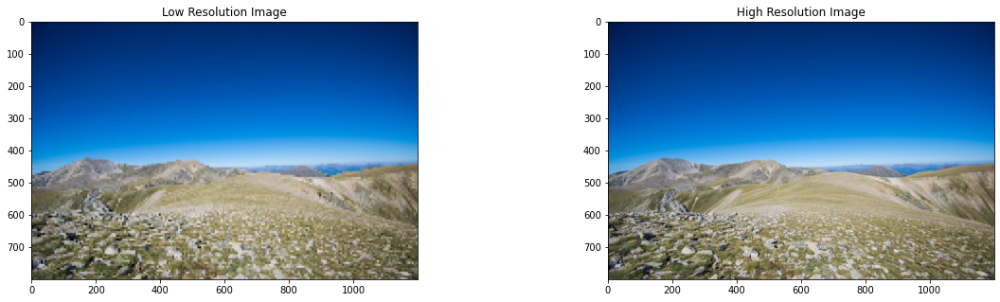

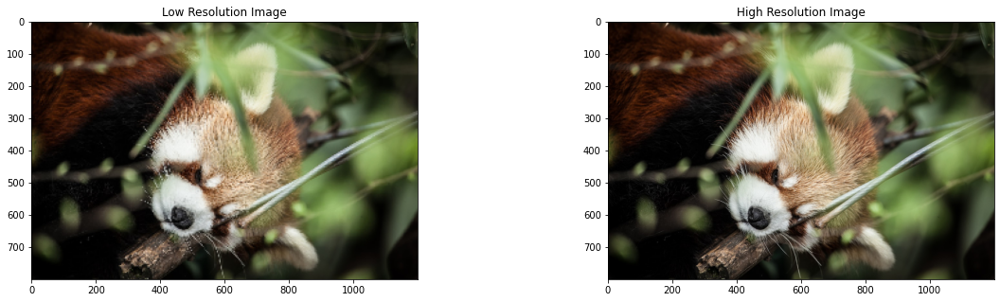

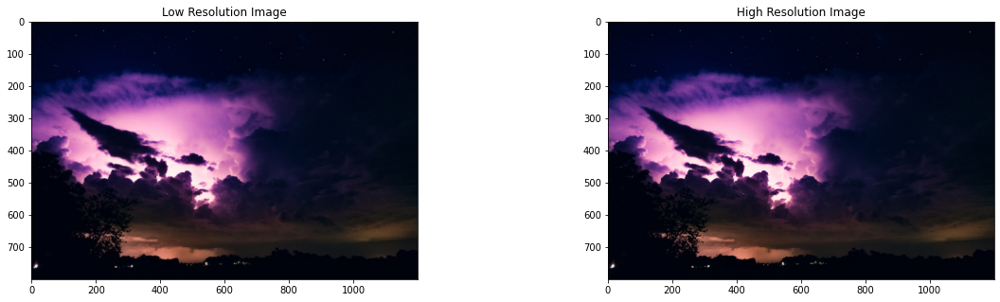

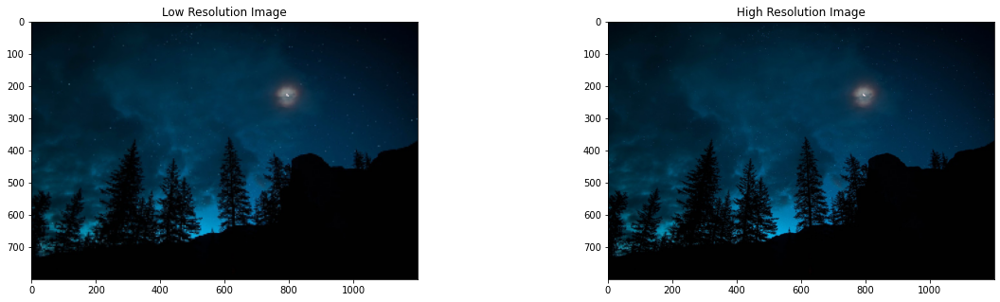

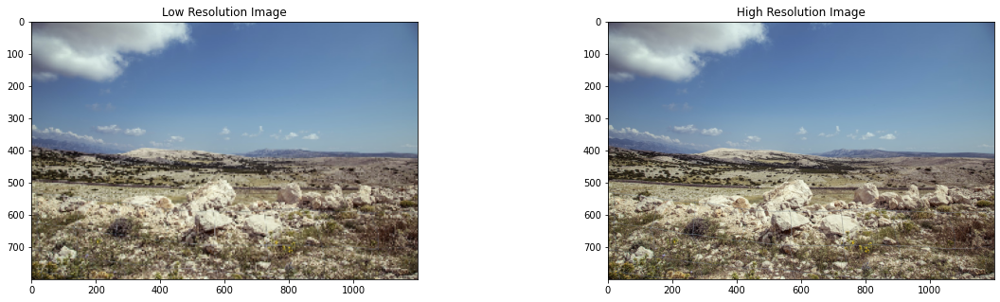

In [ ]:
n = 0
for i,m in train_generator:
    img,out = i,m

    if n < 5:
        fig, axs = plt.subplots(1 , 2, figsize=(20,5))
        axs[0].imshow(img[0])
        axs[0].set_title('Low Resolution Image')
        axs[1].imshow(out[0])
        axs[1].set_title('High Resolution Image')
        plt.show()
        n+=1
    else:
        break

# Autoencoders
- Autoencoders are an unsupervised learning technique in which we leverage neural networks for the task of representation learning. Specifically, we'll design a neural network architecture such that we impose a bottleneck in the network which forces a compressed knowledge representation of the original input.
- As visualized below, we can take an unlabeled dataset and frame it as a supervised learning problem tasked with outputting x_hat, a reconstruction of the original input x.

<div class='alert alert-info'><strong>Note: </strong>Here in our particular case we will try to reconstruct the low resolution images into their corresponding high resolution images.</div>

<img src='https://www.researchgate.net/profile/Xifeng_Guo/publication/320658590/figure/fig1/AS:614154637418504@1523437284408/The-structure-of-proposed-Convolutional-AutoEncoders-CAE-for-MNIST-In-the-middle-there.png'>

In [ ]:
input_img = Input(shape=(800, 1200, 3))

l1 = Conv2D(64, (3, 3), padding='same', activation='relu')(input_img)
l2 = Conv2D(64, (3, 3), padding='same', activation='relu')(l1)
l3 = MaxPooling2D(padding='same')(l2)
l3 = Dropout(0.3)(l3)
l4 = Conv2D(128, (3, 3),  padding='same', activation='relu')(l3)
l5 = Conv2D(128, (3, 3), padding='same', activation='relu')(l4)
l6 = MaxPooling2D(padding='same')(l5)
l7 = Conv2D(256, (3, 3), padding='same', activation='relu')(l6)

l8 = UpSampling2D()(l7)

l9 = Conv2D(128, (3, 3), padding='same', activation='relu')(l8)
l10 = Conv2D(128, (3, 3), padding='same', activation='relu')(l9)

l11 = add([l5, l10])
l12 = UpSampling2D()(l11)
l13 = Conv2D(64, (3, 3), padding='same', activation='relu')(l12)
l14 = Conv2D(64, (3, 3), padding='same', activation='relu')(l13)

l15 = add([l14, l2])

decoded = Conv2D(3, (3, 3), padding='same', activation='relu')(l15)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

## Reconstruction Loss

<img src='https://www.jeremyjordan.me/content/images/2018/03/Screen-Shot-2018-03-09-at-10.20.44-AM.png'>

In [ ]:
autoencoder.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 800, 1200, 3 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 800, 1200, 64 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 800, 1200, 64 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 400, 600, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

# Model Training
<img src='https://cdn.analyticsvidhya.com/wp-content/uploads/2018/04/1IrdJ5PghD9YoOyVAQ73MJw.gif'>

In [ ]:
train_samples = train_hiresimage_generator.samples
val_samples = val_hiresimage_generator.samples

train_img_gen = imageGenerator(train_generator)
val_image_gen = imageGenerator(val_generator)

In [ ]:
model_path = "autoencoder.h5"
checkpoint = ModelCheckpoint(model_path,
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

earlystop = EarlyStopping(monitor = 'val_loss',
                          min_delta = 0,
                          patience = 9,
                          verbose = 1,
                          restore_best_weights = True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=5,
                                            verbose=1,
                                            factor=0.2,
                                            min_lr=0.00000001)

In [ ]:
hist = autoencoder.fit(train_img_gen,
                    steps_per_epoch=train_samples//batch_size,
                    validation_data=val_image_gen,
                    validation_steps=val_samples//batch_size,
                    epochs=10, callbacks=[earlystop, checkpoint, learning_rate_reduction])

Epoch 1/10
799/799 [==============================] - 860s 1s/step - loss: 0.0066 - accuracy: 0.8478 - val_loss: 0.0013 - val_accuracy: 0.9270

Epoch 00001: val_loss improved from inf to 0.00130, saving model to autoencoder.h5
Epoch 2/10


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


799/799 [==============================] - 836s 1s/step - loss: 0.0027 - accuracy: 0.8911 - val_loss: 0.0011 - val_accuracy: 0.8818

Epoch 00002: val_loss improved from 0.00130 to 0.00114, saving model to autoencoder.h5
Epoch 3/10
799/799 [==============================] - 836s 1s/step - loss: 0.0025 - accuracy: 0.8966 - val_loss: 0.0010 - val_accuracy: 0.8804

Epoch 00003: val_loss improved from 0.00114 to 0.00104, saving model to autoencoder.h5
Epoch 4/10
799/799 [==============================] - 836s 1s/step - loss: 0.0025 - accuracy: 0.8929 - val_loss: 9.3299e-04 - val_accuracy: 0.8965

Epoch 00004: val_loss improved from 0.00104 to 0.00093, saving model to autoencoder.h5
Epoch 5/10
799/799 [==============================] - 837s 1s/step - loss: 0.0024 - accuracy: 0.9006 - val_loss: 8.6715e-04 - val_accuracy: 0.9126

Epoch 00005: val_loss improved from 0.00093 to 0.00087, saving model to autoencoder.h5
Epoch 6/10
799/799 [==============================] - 836s 1s/step - loss: 0.00

# Inference

## Learning Curves

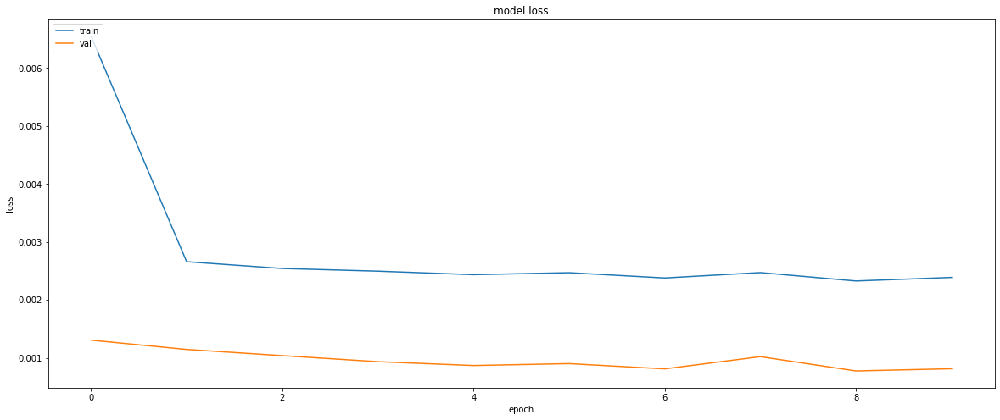

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Results
- Original Image, Ground Truth Image, Predicted Super Resolution Image

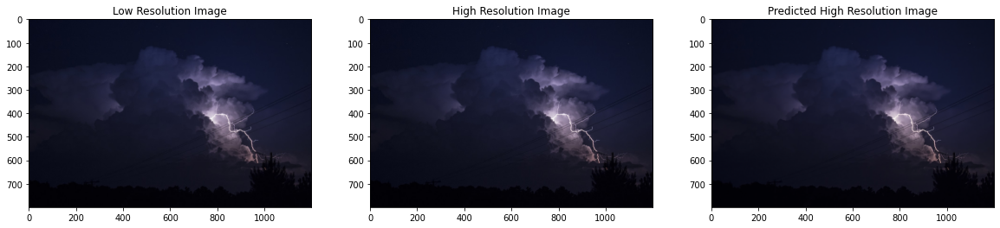

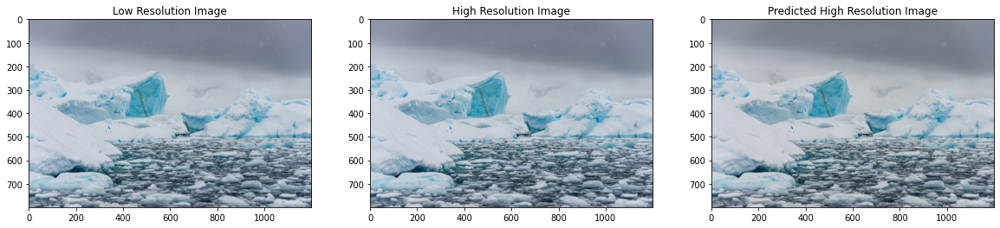

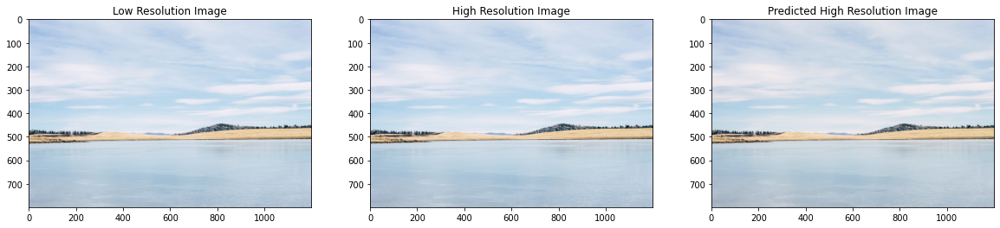

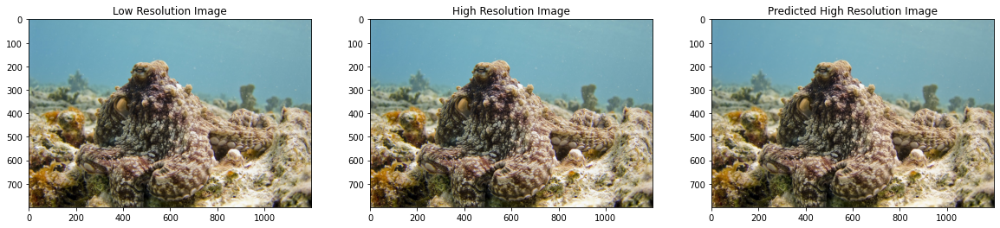

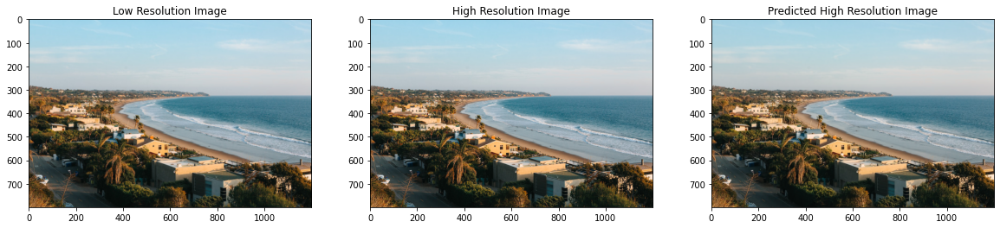

...

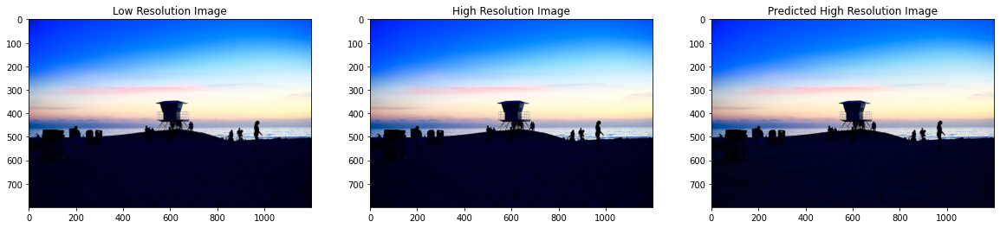

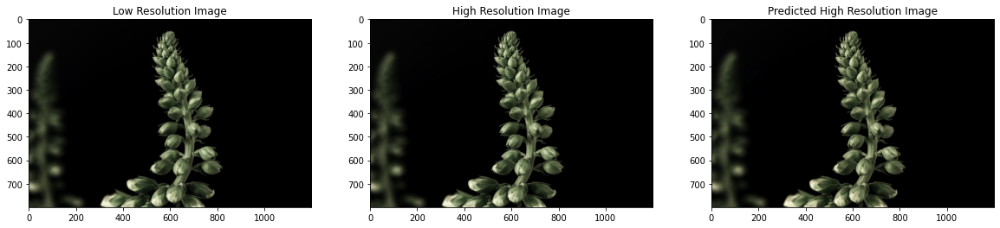

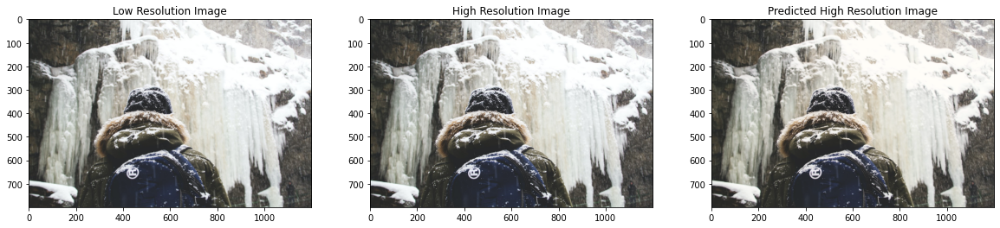

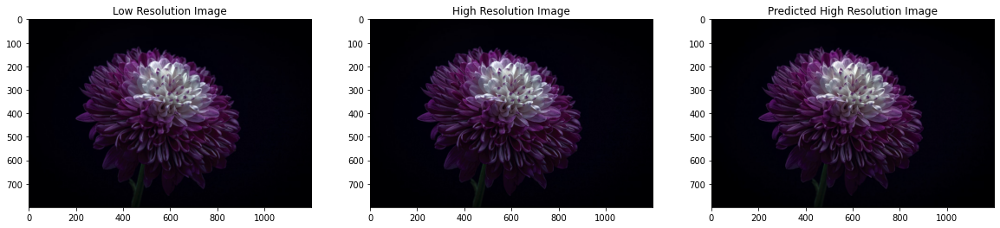

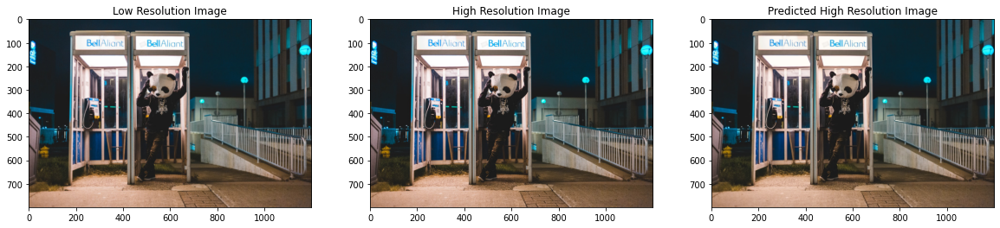

In [ ]:
n = 0
for i,m in val_generator:
    img,mask = i,m
    sr1 = autoencoder.predict(img)
    if n < 20:
        fig, axs = plt.subplots(1 , 3, figsize=(20,4))
        axs[0].imshow(img[0])
        axs[0].set_title('Low Resolution Image')
        axs[1].imshow(mask[0])
        axs[1].set_title('High Resolution Image')
        axs[2].imshow(sr1[0])
        axs[2].set_title('Predicted High Resolution Image')
        plt.show()
        n+=1
    else:
        break

<div class='alert alert-success'><strong>Conclusion:</strong>
    <li>The reconstruction loss achieved over here seems to hit a plateau after initial iterations</li>
    <li>Other variations of autoencoders can be used to improve the generation of high resolution images</li>
    <li>Conditional GANs can be used as one of the approaches</li>
</div>